# Goal

* Model that learns (X,Y,r) of Gaussian Blurs to detect them and put circle exactly around them.

# Imports

In [84]:
import torch.nn as nn
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
from torchsummary import summary

# Data

$$ G = \frac{-(\widetilde{X}^2 - \widetilde{Y}^2)}{2\sigma^2} $$

$ \widetilde{X} = X - C_x $

$ \widetilde{Y} = Y - C_y $

In [85]:
n_blurs = 1000
img_size = 91
x = np.linspace(-4,4,img_size)
X, Y = np.meshgrid(x, x)

images = torch.zeros(n_blurs, 1, img_size, img_size)
labels = torch.zeros(n_blurs, 3)

for i in range(1000):
  ro = 2*np.random.randn(2) # random offset
  width = np.random.rand()*10+5
  G = np.exp(
      - ((X-ro[0])**2 + (Y-ro[1])**2) / width # every other label is odd or even due to i%2
  )
  G = G + np.random.randn(img_size, img_size)/10

  # add image and label
  images[i,:,:,:] = torch.Tensor(G).view(1,img_size, img_size)
  labels[i,:] = torch.Tensor([ro[0], ro[1], width])


# Display

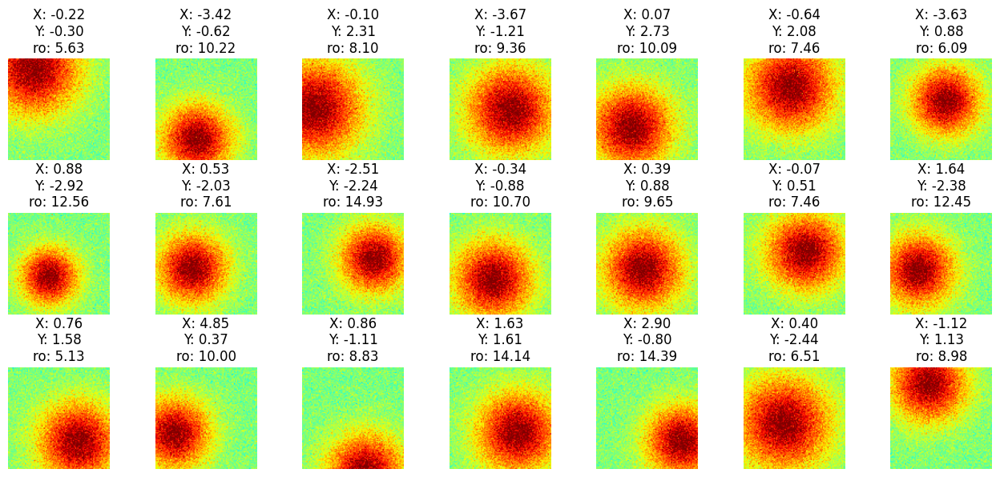

In [86]:
fig, axs = plt.subplots(3, 7, figsize = (13, 6))

for i, ax in enumerate(axs.flatten()):
  rand_row = np.random.randint(images.shape[0])
  ax.imshow(images[rand_row].squeeze(), vmin = -1, vmax = 1, cmap = 'jet')
  ax.set_title(f'X: {labels[i][0]:.2f}\nY: {labels[i][1]:.2f}\nro: {labels[i][2]:.2f}')
  ax.axis('off')
  ax.set_xticks([])
  ax.set_yticks([])

plt.tight_layout()
plt.show()

# Loaders

In [87]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size = .2)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, drop_last = True)
test_dataloader = DataLoader(test_dataset, batch_size = test_data.shape[0], shuffle = False)

In [88]:
images.shape

torch.Size([1000, 1, 91, 91])

In [89]:
labels.shape

torch.Size([1000, 3])

# Model

In [90]:
def CreateModel():

  class CreateNet(nn.Module):
    def __init__(self):
      super().__init__()

      self.enc = nn.Sequential(
          nn.Conv2d(1, 6, 3, 1, 1),   # out_size = ((in_size + 2*padding - kernel) / stride ) + 1 = ((91 + 2 - 3) / 1) + 1 = 91
          nn.ReLU(),
          nn.AvgPool2d(2,2),          # out_size = 91 // 2 = 45

          nn.Conv2d(6, 4, 3, 1, 1),   # out_size = (45 + 2 - 3) / 1 + 1 = 45
          nn.ReLU(),
          nn.AvgPool2d(2,2),          # out_size = 45 // 2 = 22

          nn.Flatten(),
          nn.Linear(22 * 22 * 4, 50),
          nn.Linear(50, 3)
      )

    def forward(self, x):
      x = self.enc(x)
      return x

  net = CreateNet()
  loss_fn = nn.MSELoss()
  optimizer = torch.optim.Adam(net.parameters(), lr = 1e-3)

  return net, loss_fn, optimizer

In [91]:
net, loss_fn, optimizer = CreateModel()
X, y = next(iter(train_dataloader))
y_hat = net(X)
loss = loss_fn(y_hat, y)
loss

tensor(39.4884, grad_fn=<MseLossBackward0>)

In [92]:
summary(net, (1, img_size, img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         AvgPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         AvgPool2d-6            [-1, 4, 22, 22]               0
           Flatten-7                 [-1, 1936]               0
            Linear-8                   [-1, 50]          96,850
            Linear-9                    [-1, 3]             153
Total params: 97,283
Trainable params: 97,283
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.00
Params size (MB): 0.37
Estimated Total Size (MB): 1.41
---------------------------------------------

# Train Loop

In [93]:
def RunModel(epochs):

  # create a new model
  net, loss_fn, optimizer = CreateModel()

  # initialize losses
  train_losses = torch.zeros(epochs)
  test_losses = torch.zeros(epochs)

  for epoch in range(epochs):
    # loop over training data batches
    batch_losses = []
    batch_accs = []

    for X, y in train_dataloader:

      # forward pass and loss
      y_hat = net(X)
      loss = loss_fn(y_hat, y)

      # backprop
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      # batch loss and acc
      batch_losses.append(loss.item())

    # losses
    train_losses[epoch] = np.mean(batch_losses)

    # test acc
    X, y = next(iter(test_dataloader))
    with torch.no_grad():
      y_hat = net(X)
      loss = loss_fn(y_hat, y)

    test_losses[epoch] = loss.item()

    print(f'Epoch {epoch} Train Loss: {train_losses[epoch]:.4f}, Test Loss: {test_losses[epoch]:.4f}')

  return train_losses, test_losses, net

In [95]:
train_losses, test_losses, net = RunModel(epochs=30)

Epoch 0 Train Loss: 11.5710, Test Loss: 3.6044
Epoch 1 Train Loss: 2.4100, Test Loss: 1.9513
Epoch 2 Train Loss: 1.7567, Test Loss: 1.6545
Epoch 3 Train Loss: 1.3847, Test Loss: 1.4026
Epoch 4 Train Loss: 1.0644, Test Loss: 1.1286
Epoch 5 Train Loss: 0.7973, Test Loss: 0.9651
Epoch 6 Train Loss: 0.6672, Test Loss: 0.8781
Epoch 7 Train Loss: 0.6153, Test Loss: 0.8462
Epoch 8 Train Loss: 0.5781, Test Loss: 0.8515
Epoch 9 Train Loss: 0.5435, Test Loss: 0.7661
Epoch 10 Train Loss: 0.5344, Test Loss: 0.8378
Epoch 11 Train Loss: 0.4990, Test Loss: 0.7339
Epoch 12 Train Loss: 0.4669, Test Loss: 0.7107
Epoch 13 Train Loss: 0.4524, Test Loss: 0.7312
Epoch 14 Train Loss: 0.4459, Test Loss: 0.7296
Epoch 15 Train Loss: 0.4218, Test Loss: 0.6585
Epoch 16 Train Loss: 0.4062, Test Loss: 0.6881
Epoch 17 Train Loss: 0.4014, Test Loss: 0.6955
Epoch 18 Train Loss: 0.3819, Test Loss: 0.6139
Epoch 19 Train Loss: 0.3607, Test Loss: 0.6295
Epoch 20 Train Loss: 0.3513, Test Loss: 0.6090
Epoch 21 Train Loss: 0

# Loss

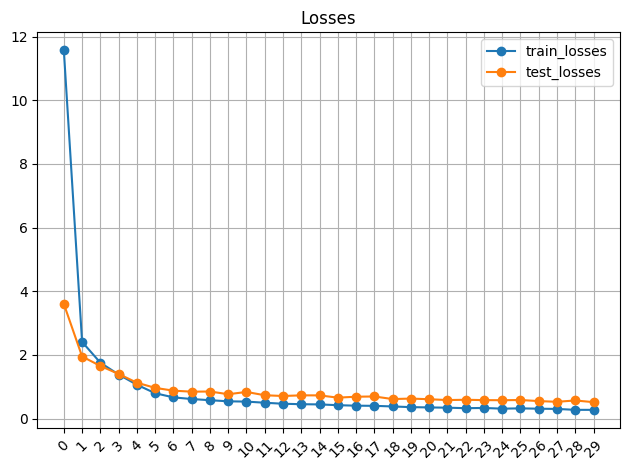

In [96]:
plt.plot(train_losses, '-o',label = 'train_losses')
plt.plot(test_losses, '-o',label = 'test_losses')
plt.title('Losses')
plt.xticks(range(len(train_losses)), rotation=45)
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

# Check Model

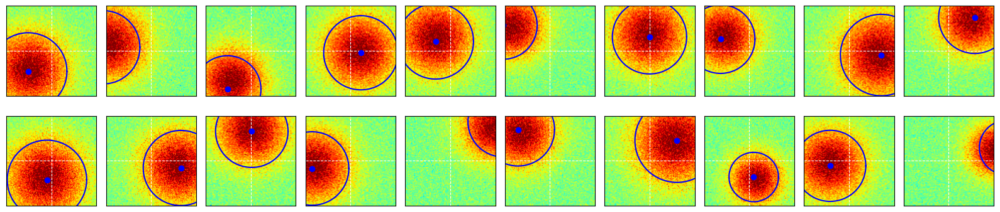

In [97]:
def show_res(test_dataloader):
  X, Y = next(iter(test_dataloader))
  y_hat = net(X)

  fig, axs = plt.subplots(2, 10, figsize=(16, 4))

  th = np.linspace(0, 2*np.pi, 300)

  for i, ax in enumerate(axs.flatten()):

      G = X[i, 0].detach().cpu()

      ax.imshow(
          G,
          vmin=-1, vmax=1,
          cmap='jet',
          extent=[-4, 4, -4, 4],
          origin = 'lower'
      )

      ax.plot([-4, 4], [0, 0], 'w--', lw=0.8)
      ax.plot([0, 0], [-4, 4], 'w--', lw=0.8)

      cx = y_hat[i, 0].item()
      cy = y_hat[i, 1].item()
      sigma2 = y_hat[i, 2].item()

      sigma = np.sqrt(max(sigma2, 0))

      x = cx + np.cos(th) * sigma
      y = cy + np.sin(th) * sigma

      ax.plot(x, y, 'b')
      ax.plot(cx, cy, 'bo')

      ax.set_xlim([-4, 4])
      ax.set_ylim([-4, 4])
      ax.set_xticks([])
      ax.set_yticks([])

  plt.tight_layout()
  plt.show()

  return X, Y, y_hat

X, Y, y_hat = show_res(test_dataloader)

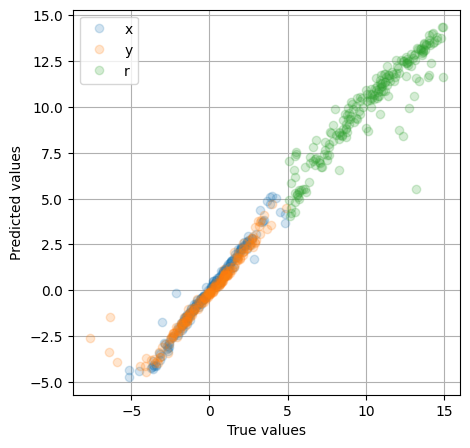

In [98]:
fig = plt.figure(figsize = (5,5))

for i in range(3):
  plt.plot(Y[:,i], y_hat[:,i].detach(), 'o', alpha=.2)

plt.legend(['x','y','r'])
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.grid()
plt.show()

# Noise resistance check

## noise = 0.5

In [99]:
import torch.nn as nn
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
from torchsummary import summary

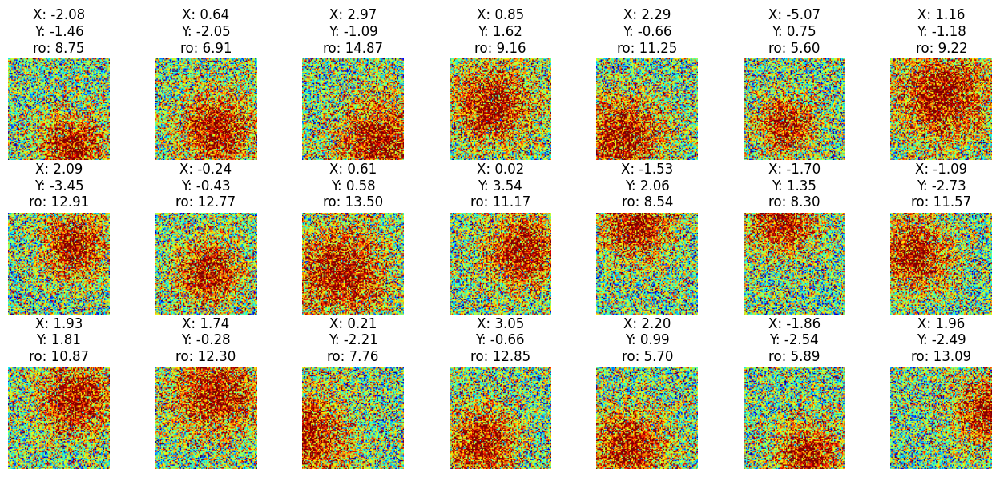

In [100]:
def noiseRes(noise):
  n_blurs = 1000
  img_size = 91
  x = np.linspace(-4,4,img_size)
  X, Y = np.meshgrid(x, x)

  images = torch.zeros(n_blurs, 1, img_size, img_size)
  labels = torch.zeros(n_blurs, 3)

  for i in range(1000):
    ro = 2*np.random.randn(2) # random offset
    width = np.random.rand()*10+5
    G = np.exp(
        - ((X-ro[0])**2 + (Y-ro[1])**2) / width # every other label is odd or even due to i%2
    )
    G = G + np.random.randn(img_size, img_size) * noise

    # add image and label
    images[i,:,:,:] = torch.Tensor(G).view(1,img_size, img_size)
    labels[i,:] = torch.Tensor([ro[0], ro[1], width])

  fig, axs = plt.subplots(3, 7, figsize = (13, 6))

  for i, ax in enumerate(axs.flatten()):
    rand_row = np.random.randint(images.shape[0])
    ax.imshow(images[rand_row].squeeze(), vmin = -1, vmax = 1, cmap = 'jet')
    ax.set_title(f'X: {labels[i][0]:.2f}\nY: {labels[i][1]:.2f}\nro: {labels[i][2]:.2f}')
    ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

  plt.tight_layout()
  plt.show()

  return images, labels

images, labels = noiseRes(.5)

In [101]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size = .2)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, drop_last = True)
test_dataloader = DataLoader(test_dataset, batch_size = test_data.shape[0], shuffle = False)

In [102]:
train_losses, test_losses, net = RunModel(epochs=30)

Epoch 0 Train Loss: 8.7155, Test Loss: 3.7389
Epoch 1 Train Loss: 2.7326, Test Loss: 2.1341
Epoch 2 Train Loss: 2.0776, Test Loss: 1.9362
Epoch 3 Train Loss: 1.9241, Test Loss: 1.8299
Epoch 4 Train Loss: 1.7869, Test Loss: 1.6759
Epoch 5 Train Loss: 1.5472, Test Loss: 1.4409
Epoch 6 Train Loss: 1.3052, Test Loss: 1.2601
Epoch 7 Train Loss: 1.0404, Test Loss: 0.9810
Epoch 8 Train Loss: 0.7567, Test Loss: 0.8226
Epoch 9 Train Loss: 0.6282, Test Loss: 0.7592
Epoch 10 Train Loss: 0.5615, Test Loss: 0.7510
Epoch 11 Train Loss: 0.5281, Test Loss: 0.7670
Epoch 12 Train Loss: 0.4893, Test Loss: 0.7504
Epoch 13 Train Loss: 0.4666, Test Loss: 0.7588
Epoch 14 Train Loss: 0.4463, Test Loss: 0.7649
Epoch 15 Train Loss: 0.4214, Test Loss: 0.7699
Epoch 16 Train Loss: 0.4004, Test Loss: 0.7950
Epoch 17 Train Loss: 0.3940, Test Loss: 0.7718
Epoch 18 Train Loss: 0.3597, Test Loss: 0.8273
Epoch 19 Train Loss: 0.3477, Test Loss: 0.8130
Epoch 20 Train Loss: 0.3296, Test Loss: 0.8436
Epoch 21 Train Loss: 0.

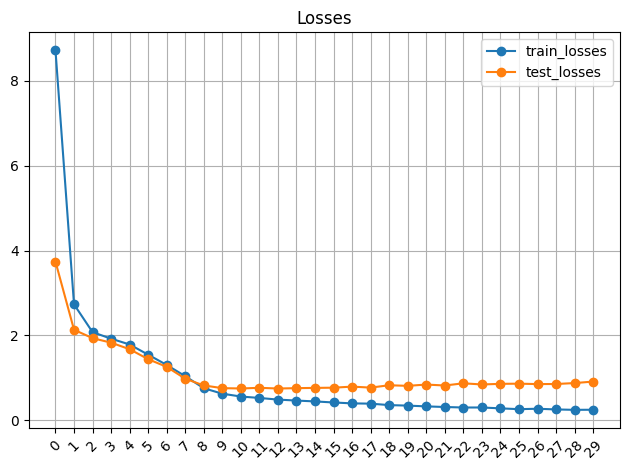

In [103]:
plt.plot(train_losses, '-o',label = 'train_losses')
plt.plot(test_losses, '-o',label = 'test_losses')
plt.title('Losses')
plt.xticks(range(len(train_losses)), rotation=45)
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

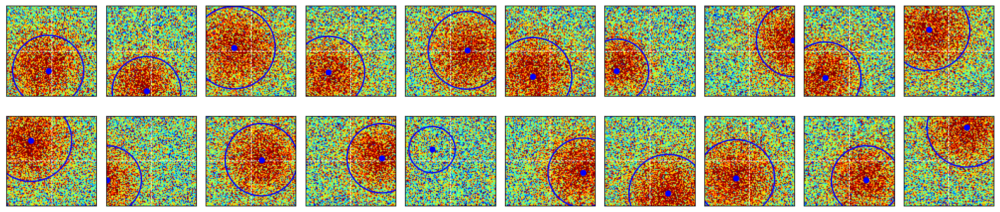

In [104]:
X, Y, y_hat = show_res(test_dataloader)

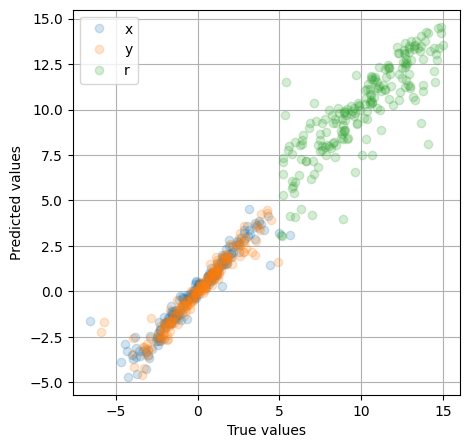

In [105]:
fig = plt.figure(figsize = (5,5))

for i in range(3):
  plt.plot(Y[:,i], y_hat[:,i].detach(), 'o', alpha=.2)

plt.legend(['x','y','r'])
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.grid()
plt.show()

Model still hand

## noise = 1

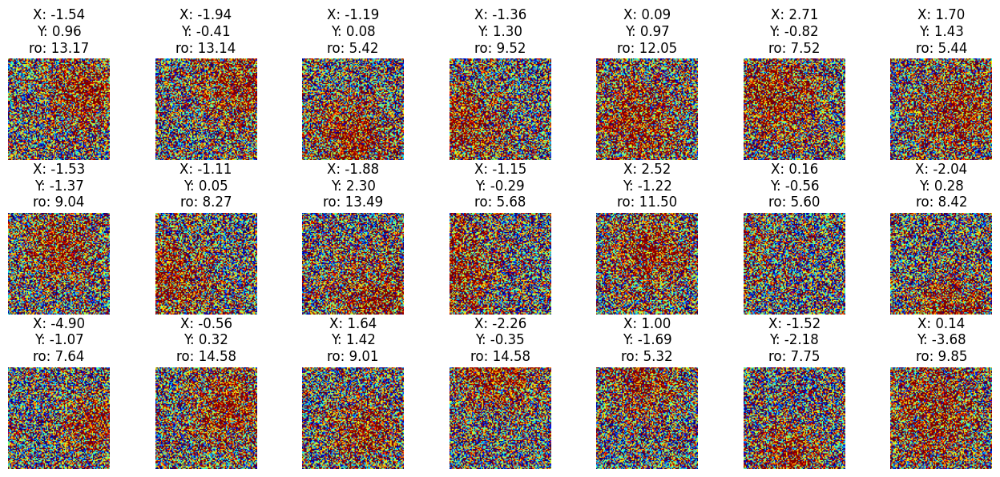

In [106]:
images, labels = noiseRes(1)

In [107]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size = .2)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, drop_last = True)
test_dataloader = DataLoader(test_dataset, batch_size = test_data.shape[0], shuffle = False)

In [108]:
train_losses, test_losses, net = RunModel(epochs=30)

Epoch 0 Train Loss: 9.1592, Test Loss: 4.4686
Epoch 1 Train Loss: 3.3906, Test Loss: 2.5463
Epoch 2 Train Loss: 2.2784, Test Loss: 2.1591
Epoch 3 Train Loss: 1.7990, Test Loss: 1.8191
Epoch 4 Train Loss: 1.4880, Test Loss: 1.4753
Epoch 5 Train Loss: 1.3290, Test Loss: 1.4061
Epoch 6 Train Loss: 1.2572, Test Loss: 1.3540
Epoch 7 Train Loss: 1.2269, Test Loss: 1.3443
Epoch 8 Train Loss: 1.1515, Test Loss: 1.3130
Epoch 9 Train Loss: 1.1396, Test Loss: 1.5398
Epoch 10 Train Loss: 1.1299, Test Loss: 1.2676
Epoch 11 Train Loss: 1.0537, Test Loss: 1.5188
Epoch 12 Train Loss: 1.1085, Test Loss: 1.2950
Epoch 13 Train Loss: 1.0203, Test Loss: 1.2397
Epoch 14 Train Loss: 1.0453, Test Loss: 1.2128
Epoch 15 Train Loss: 0.9701, Test Loss: 1.1963
Epoch 16 Train Loss: 0.9420, Test Loss: 1.2168
Epoch 17 Train Loss: 0.9036, Test Loss: 1.2044
Epoch 18 Train Loss: 0.8791, Test Loss: 1.2191
Epoch 19 Train Loss: 0.8662, Test Loss: 1.1853
Epoch 20 Train Loss: 0.8771, Test Loss: 1.2498
Epoch 21 Train Loss: 0.

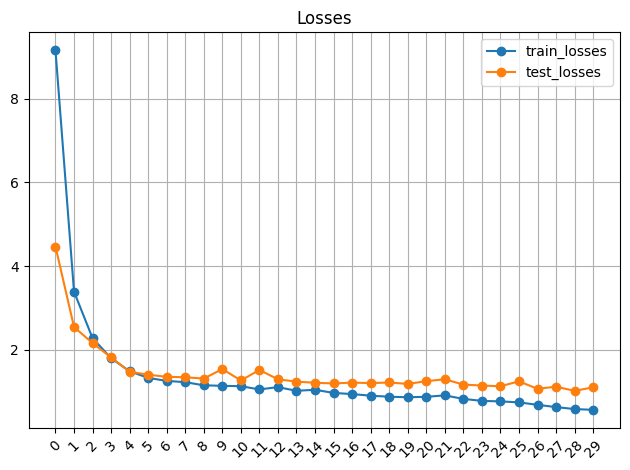

In [109]:
plt.plot(train_losses, '-o',label = 'train_losses')
plt.plot(test_losses, '-o',label = 'test_losses')
plt.title('Losses')
plt.xticks(range(len(train_losses)), rotation=45)
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

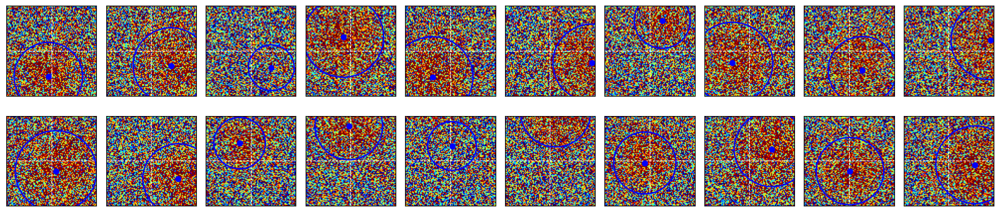

In [110]:
X, Y, y_hat = show_res(test_dataloader)

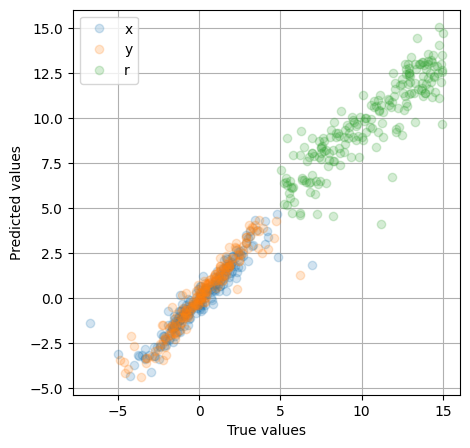

In [111]:
fig = plt.figure(figsize = (5,5))

for i in range(3):
  plt.plot(Y[:,i], y_hat[:,i].detach(), 'o', alpha=.2)

plt.legend(['x','y','r'])
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.grid()
plt.show()

## noise = 2

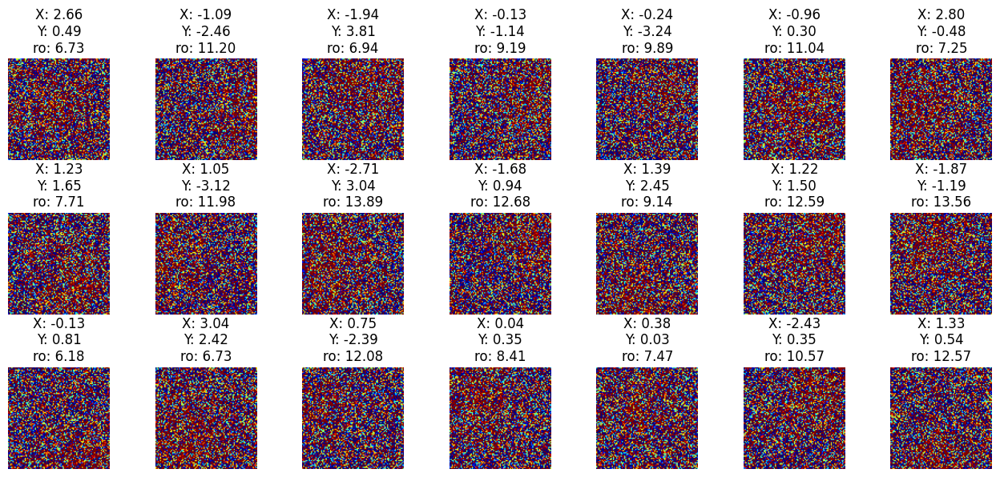

In [112]:
images, labels = noiseRes(2)

In [113]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size = .2)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, drop_last = True)
test_dataloader = DataLoader(test_dataset, batch_size = test_data.shape[0], shuffle = False)

In [114]:
train_losses, test_losses, net = RunModel(epochs=30)

Epoch 0 Train Loss: 9.0708, Test Loss: 4.0850
Epoch 1 Train Loss: 3.2403, Test Loss: 2.4566
Epoch 2 Train Loss: 2.2897, Test Loss: 2.1568
Epoch 3 Train Loss: 1.8599, Test Loss: 1.9528
Epoch 4 Train Loss: 1.5978, Test Loss: 1.7774
Epoch 5 Train Loss: 1.3959, Test Loss: 1.6371
Epoch 6 Train Loss: 1.2952, Test Loss: 1.6634
Epoch 7 Train Loss: 1.2413, Test Loss: 1.5486
Epoch 8 Train Loss: 1.1370, Test Loss: 1.5693
Epoch 9 Train Loss: 1.0716, Test Loss: 1.6581
Epoch 10 Train Loss: 1.0242, Test Loss: 1.5447
Epoch 11 Train Loss: 0.9683, Test Loss: 1.5433
Epoch 12 Train Loss: 0.8858, Test Loss: 1.7540
Epoch 13 Train Loss: 0.8763, Test Loss: 1.5567
Epoch 14 Train Loss: 0.7868, Test Loss: 1.7604
Epoch 15 Train Loss: 0.8440, Test Loss: 1.5567
Epoch 16 Train Loss: 0.7292, Test Loss: 1.6062
Epoch 17 Train Loss: 0.7845, Test Loss: 2.0878
Epoch 18 Train Loss: 0.7366, Test Loss: 1.6464
Epoch 19 Train Loss: 0.6305, Test Loss: 1.6389
Epoch 20 Train Loss: 0.6224, Test Loss: 1.6318
Epoch 21 Train Loss: 0.

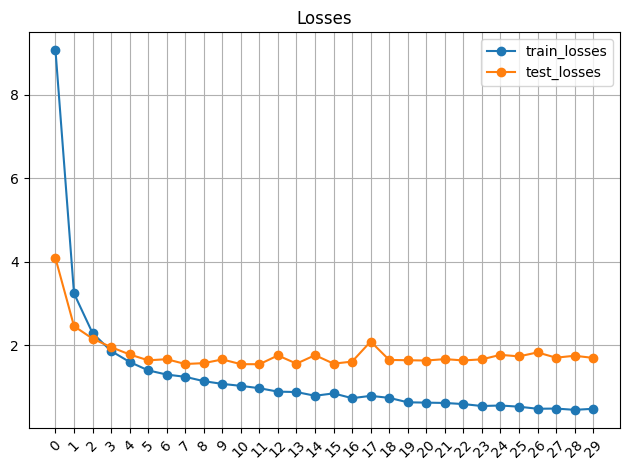

In [115]:
plt.plot(train_losses, '-o',label = 'train_losses')
plt.plot(test_losses, '-o',label = 'test_losses')
plt.title('Losses')
plt.xticks(range(len(train_losses)), rotation=45)
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

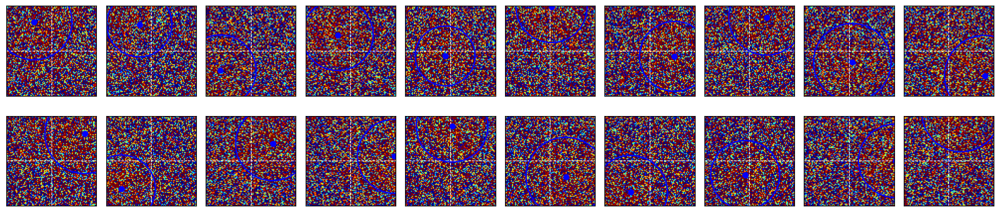

In [116]:
X, Y, y_hat = show_res(test_dataloader)

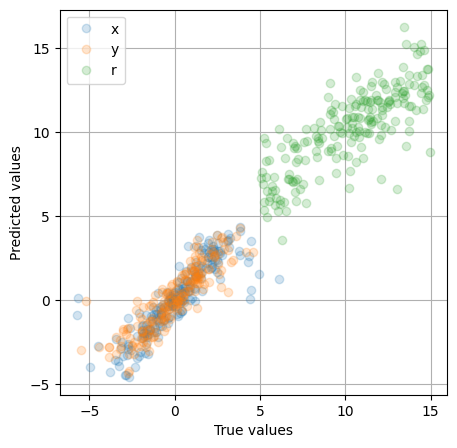

In [117]:
fig = plt.figure(figsize = (5,5))

for i in range(3):
  plt.plot(Y[:,i], y_hat[:,i].detach(), 'o', alpha=.2)

plt.legend(['x','y','r'])
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.grid()
plt.show()

model still performs better than some human could

## noise = 4

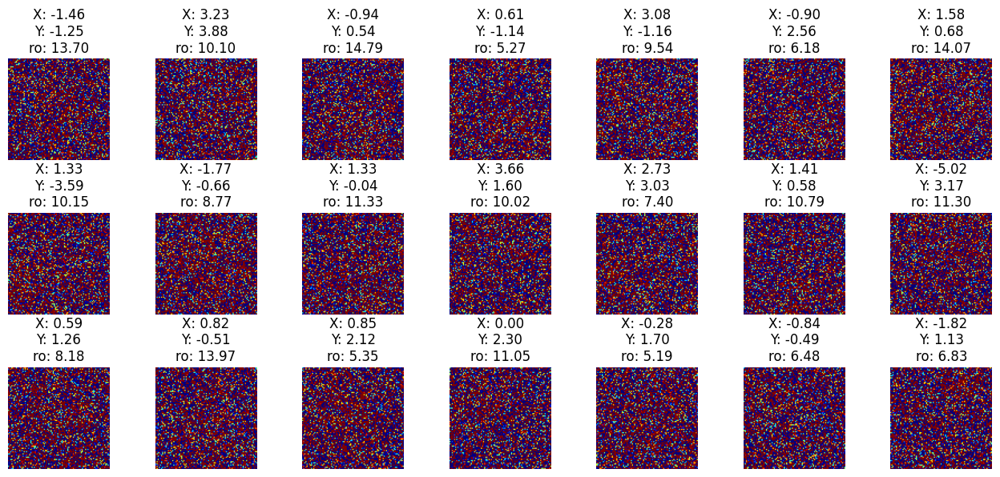

In [118]:
images, labels = noiseRes(4)

In [119]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size = .2)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, drop_last = True)
test_dataloader = DataLoader(test_dataset, batch_size = test_data.shape[0], shuffle = False)

In [120]:
train_losses, test_losses, net = RunModel(epochs=30)

Epoch 0 Train Loss: 11.2577, Test Loss: 4.9086
Epoch 1 Train Loss: 4.7301, Test Loss: 4.3119
Epoch 2 Train Loss: 4.0492, Test Loss: 3.7601
Epoch 3 Train Loss: 3.2939, Test Loss: 3.0462
Epoch 4 Train Loss: 2.6189, Test Loss: 2.8765
Epoch 5 Train Loss: 2.4800, Test Loss: 2.6810
Epoch 6 Train Loss: 2.3511, Test Loss: 2.8141
Epoch 7 Train Loss: 2.1011, Test Loss: 2.6094
Epoch 8 Train Loss: 2.0393, Test Loss: 3.0328
Epoch 9 Train Loss: 1.9396, Test Loss: 2.5123
Epoch 10 Train Loss: 1.6758, Test Loss: 2.5629
Epoch 11 Train Loss: 1.4309, Test Loss: 2.5426
Epoch 12 Train Loss: 1.3254, Test Loss: 2.5604
Epoch 13 Train Loss: 1.2553, Test Loss: 2.5365
Epoch 14 Train Loss: 1.1345, Test Loss: 2.7532
Epoch 15 Train Loss: 1.0413, Test Loss: 2.6529
Epoch 16 Train Loss: 0.9956, Test Loss: 2.6752
Epoch 17 Train Loss: 0.9500, Test Loss: 2.7768
Epoch 18 Train Loss: 0.8899, Test Loss: 3.0323
Epoch 19 Train Loss: 0.8394, Test Loss: 2.8253
Epoch 20 Train Loss: 0.7311, Test Loss: 2.9160
Epoch 21 Train Loss: 0

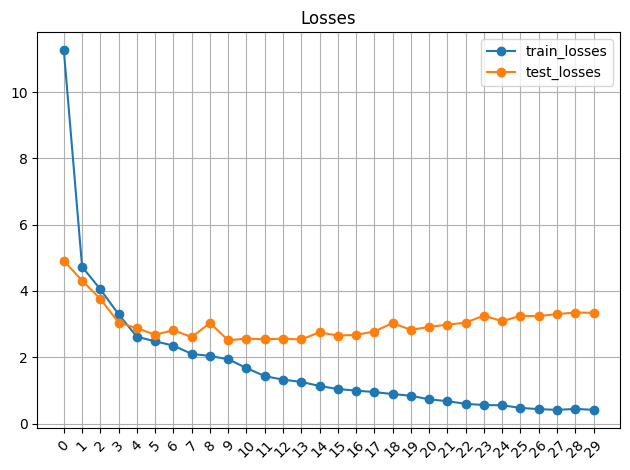

In [121]:
plt.plot(train_losses, '-o',label = 'train_losses')
plt.plot(test_losses, '-o',label = 'test_losses')
plt.title('Losses')
plt.xticks(range(len(train_losses)), rotation=45)
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

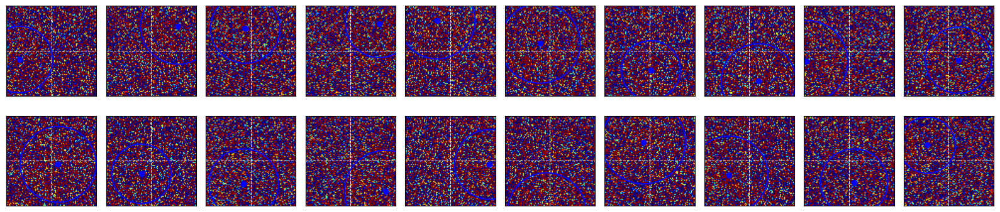

In [122]:
X, Y, y_hat = show_res(test_dataloader)

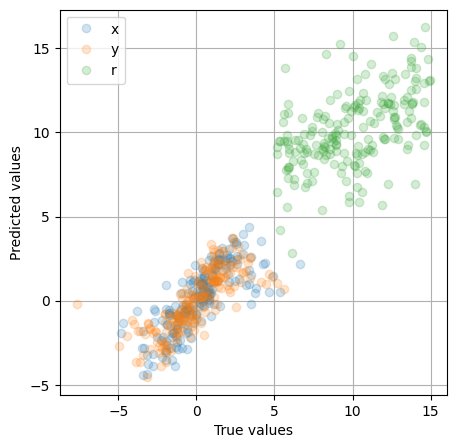

In [123]:
fig = plt.figure(figsize = (5,5))

for i in range(3):
  plt.plot(Y[:,i], y_hat[:,i].detach(), 'o', alpha=.2)

plt.legend(['x','y','r'])
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.grid()
plt.show()

# Simplified Model

In [125]:
def CreateModel():

    class Net(nn.Module):
        def __init__(self):
            super().__init__()

            self.enc = nn.Sequential(
                nn.Conv2d(1, 4, 5, padding=2),
                nn.ReLU(),
                nn.AvgPool2d(2),

                nn.Conv2d(4, 4, 3, padding=1),
                nn.AdaptiveAvgPool2d(1)
            )

            self.head = nn.Linear(4, 3)

        def forward(self, x):
            x = self.enc(x)
            return self.head(x.view(x.size(0), -1))

    net = Net()
    loss_fn = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=1e-3)

    return net, loss_fn, optimizer


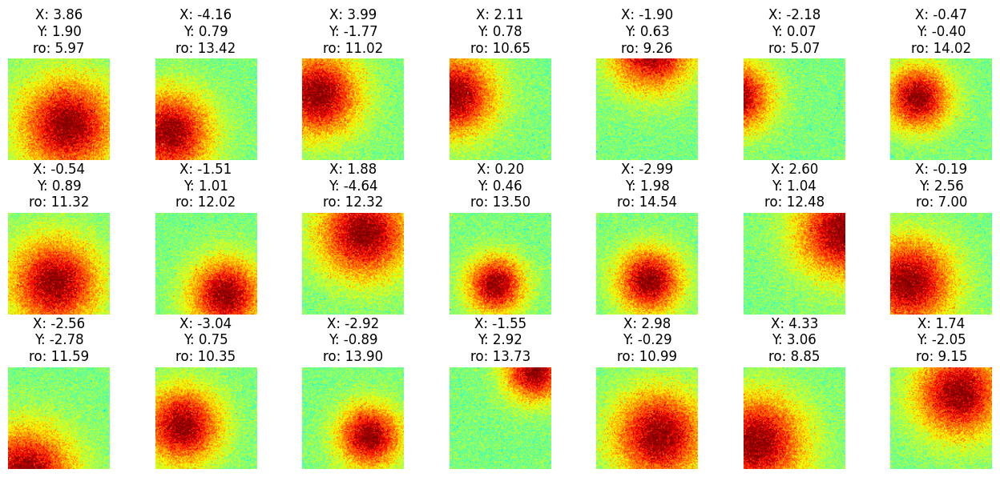

In [128]:
images, labels = noiseRes(.1)

In [129]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size = .2)

train_dataset = TensorDataset(train_data, train_labels)
test_dataset = TensorDataset(test_data, test_labels)

batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, drop_last = True)
test_dataloader = DataLoader(test_dataset, batch_size = test_data.shape[0], shuffle = False)

In [130]:
train_losses, test_losses, net = RunModel(epochs=30)

Epoch 0 Train Loss: 38.6292, Test Loss: 42.9903
Epoch 1 Train Loss: 37.8961, Test Loss: 41.4918
Epoch 2 Train Loss: 35.3190, Test Loss: 36.8434
Epoch 3 Train Loss: 28.8223, Test Loss: 26.5575
Epoch 4 Train Loss: 16.7786, Test Loss: 11.7308
Epoch 5 Train Loss: 6.3547, Test Loss: 5.2048
Epoch 6 Train Loss: 4.4521, Test Loss: 5.0814
Epoch 7 Train Loss: 4.4144, Test Loss: 5.0882
Epoch 8 Train Loss: 4.3996, Test Loss: 5.0841
Epoch 9 Train Loss: 4.3878, Test Loss: 5.0627
Epoch 10 Train Loss: 4.3759, Test Loss: 5.0402
Epoch 11 Train Loss: 4.3563, Test Loss: 5.0106
Epoch 12 Train Loss: 4.3358, Test Loss: 4.9628
Epoch 13 Train Loss: 4.3129, Test Loss: 4.9349
Epoch 14 Train Loss: 4.2894, Test Loss: 4.8865
Epoch 15 Train Loss: 4.2647, Test Loss: 4.8488
Epoch 16 Train Loss: 4.2501, Test Loss: 4.8235
Epoch 17 Train Loss: 4.2272, Test Loss: 4.7899
Epoch 18 Train Loss: 4.2100, Test Loss: 4.7541
Epoch 19 Train Loss: 4.2022, Test Loss: 4.7364
Epoch 20 Train Loss: 4.1838, Test Loss: 4.6892
Epoch 21 Trai

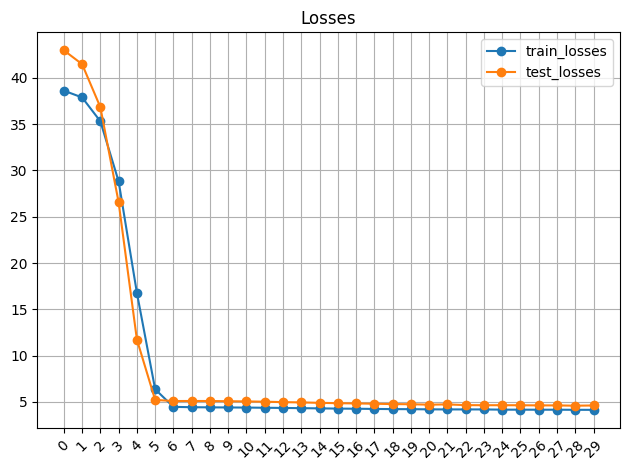

In [131]:
plt.plot(train_losses, '-o',label = 'train_losses')
plt.plot(test_losses, '-o',label = 'test_losses')
plt.title('Losses')
plt.xticks(range(len(train_losses)), rotation=45)
plt.legend()
plt.tight_layout()
plt.grid()
plt.show()

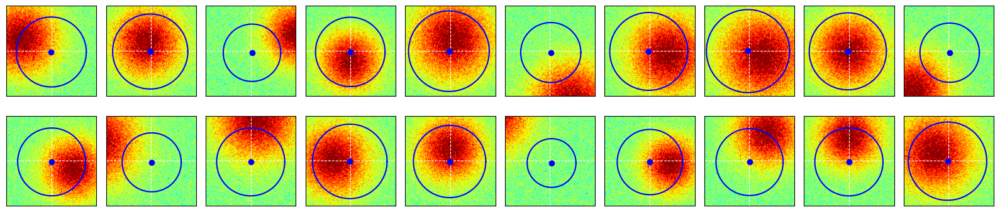

In [132]:
X, Y, y_hat = show_res(test_dataloader)

Model is too weak, loss plateau at ~5, it lacks depth.